In [2]:
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline
plt.rcParams["figure.dpi"] = 300
np.set_printoptions(precision=3, suppress=True)
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import scale, StandardScaler

In [3]:
from sklearn.datasets import load_files

reviews_train = load_files("../data/aclImdb/train/")
# load_files returns a bunch, containing training texts and training labels
text_train, y_train = reviews_train.data, reviews_train.target
print("type of text_train: {}".format(type(text_train)))
print("length of text_train: {}".format(len(text_train)))
print("text_train[1]:\n{}".format(text_train[1]))

type of text_train: <class 'list'>
length of text_train: 25000
text_train[1]:
b'Words can\'t describe how bad this movie is. I can\'t explain it by writing only. You have too see it for yourself to get at grip of how horrible a movie really can be. Not that I recommend you to do that. There are so many clich\xc3\xa9s, mistakes (and all other negative things you can imagine) here that will just make you cry. To start with the technical first, there are a LOT of mistakes regarding the airplane. I won\'t list them here, but just mention the coloring of the plane. They didn\'t even manage to show an airliner in the colors of a fictional airline, but instead used a 747 painted in the original Boeing livery. Very bad. The plot is stupid and has been done many times before, only much, much better. There are so many ridiculous moments here that i lost count of it really early. Also, I was on the bad guys\' side all the time in the movie, because the good guys were so stupid. "Executive Decisio

In [4]:
text_train = [doc.replace(b"<br />", b" ") for doc in text_train]

In [5]:
from sklearn.feature_extraction.text import CountVectorizer
vect = CountVectorizer(stop_words="english", min_df=4)
X_train = vect.fit_transform(text_train)

In [6]:
X_train.shape

(25000, 30462)

In [7]:
from sklearn.decomposition import TruncatedSVD
lsa = TruncatedSVD(n_components=100)
X_lsa = lsa.fit_transform(X_train)

In [8]:
lsa.components_.shape

(100, 30462)

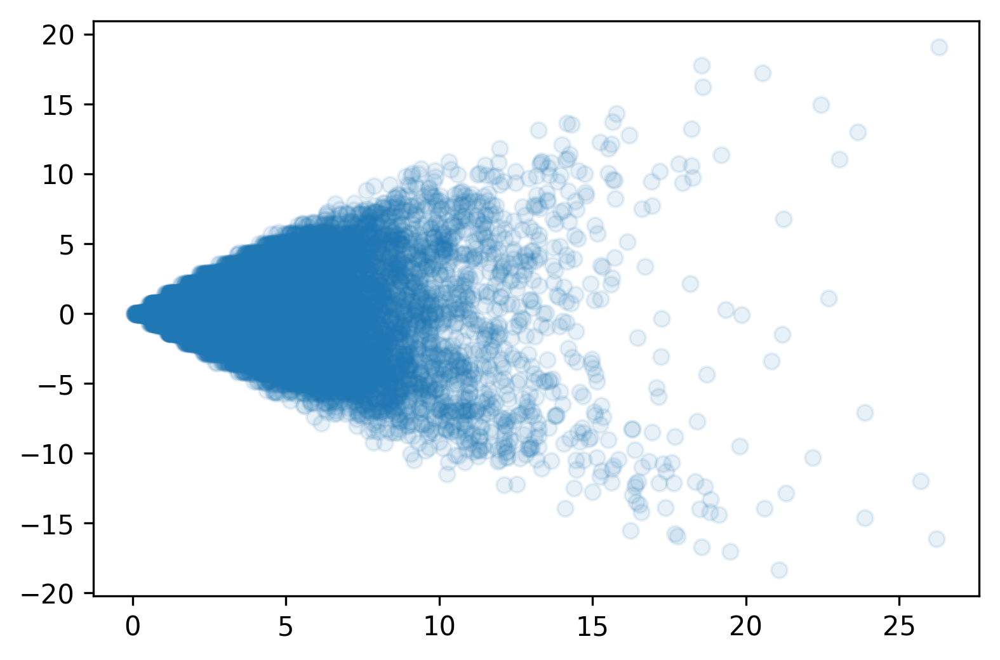

In [9]:
plt.scatter(X_lsa[:, 0], X_lsa[:, 1], alpha=.1)

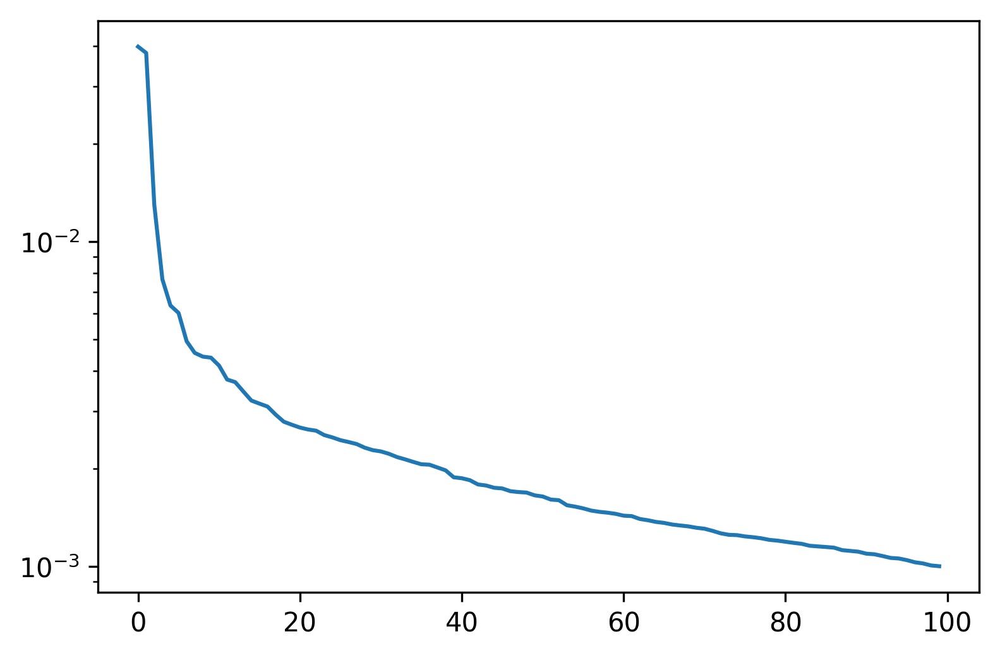

In [11]:
plt.semilogy(lsa.explained_variance_ratio_)

In [57]:
def plot_important_features(coef, feature_names, top_n=20, ax=None):
    if ax is None:
        ax = plt.gca()
    inds = np.argsort(np.abs(coef))[-top_n:]
    important_coefs = coef[inds]
    sort_sign = np.argsort(important_coefs)
    myrange = range(len(inds))
    combined_inds = inds[sort_sign]

    ax.bar(myrange, coef[combined_inds])
    ax.set_xticks(myrange)
    ax.set_xticklabels(feature_names[combined_inds], rotation=60, ha="right")

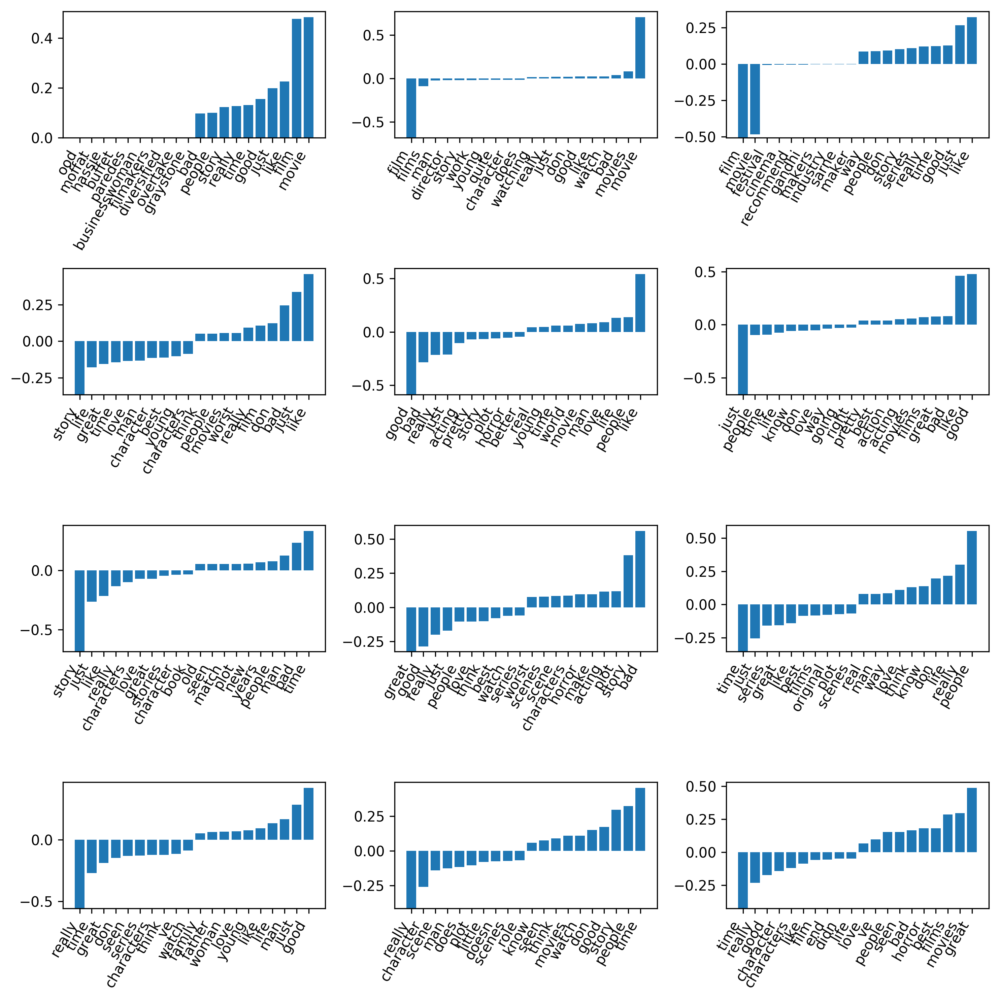

In [13]:
feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), lsa.components_):
    plot_important_features(coef, feature_names, top_n=10, ax=ax)
    
plt.tight_layout()

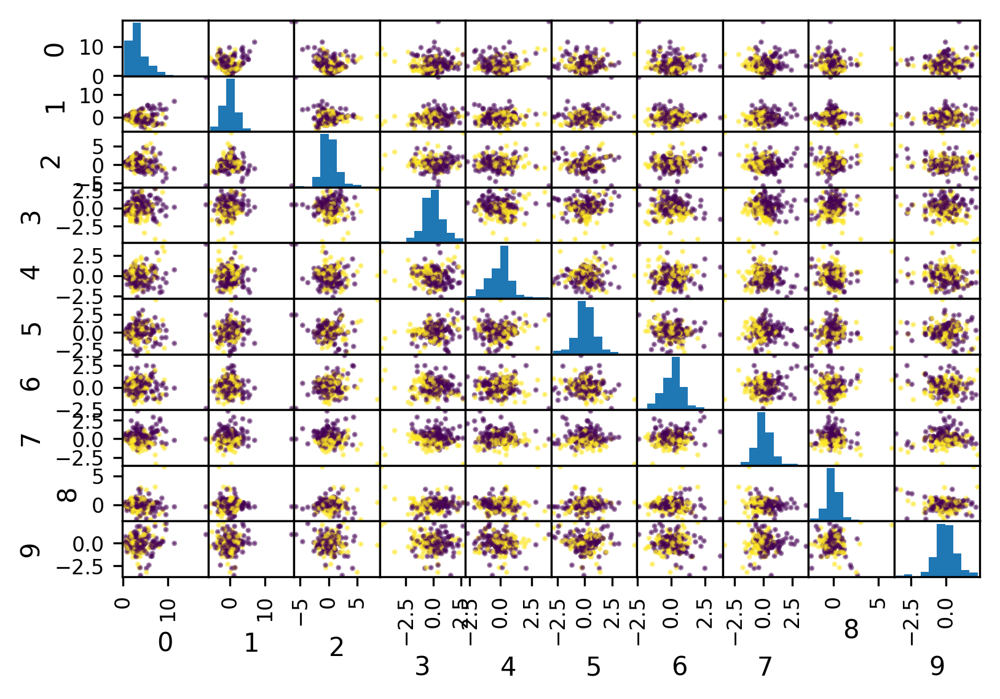

In [15]:
df = pd.DataFrame(X_lsa[::100, :10])
pd.tools.plotting.scatter_matrix(df, c=y_train[::100], s=5);

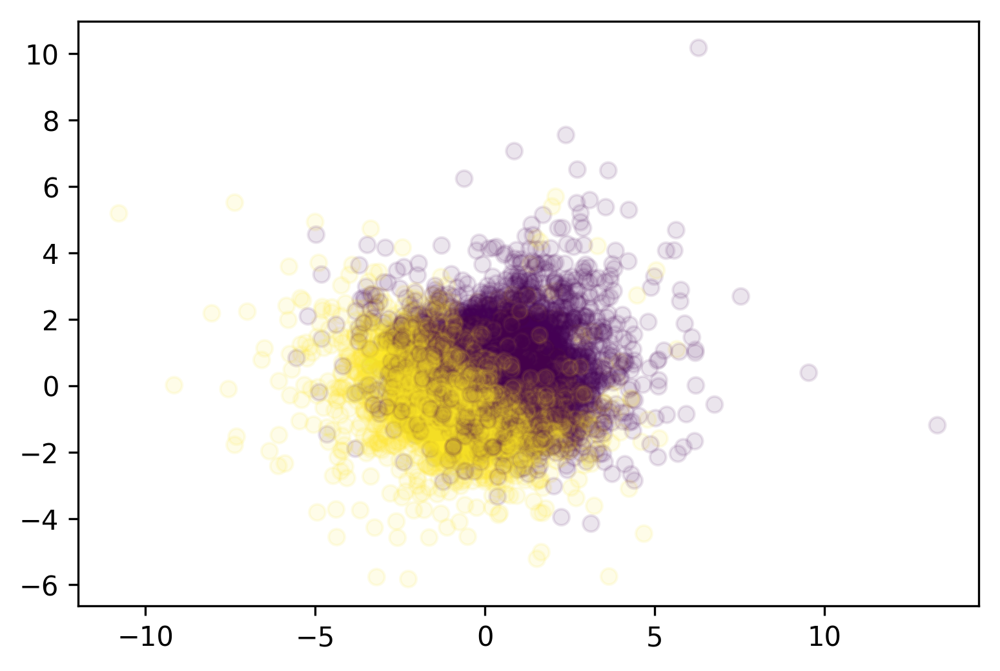

In [17]:
plt.scatter(X_lsa[:, 3], X_lsa[:, 7], alpha=.1, c=y_train)

In [30]:
from sklearn.preprocessing import MaxAbsScaler, Normalizer
scaler = MaxAbsScaler()
X_scaled = scaler.fit_transform(X_train)
X_normalized = Normalizer().fit_transform(X_train)

lsa_normalized = TruncatedSVD(n_components=100)
X_lsa_normalized = lsa_normalized.fit_transform(X_normalized)

/home/andy/checkout/scikit-learn/sklearn/utils/validation.py:427: DataConversionWarning: Data with input dtype int64 was converted to float64 by the normalize function.
  warnings.warn(msg, DataConversionWarning)


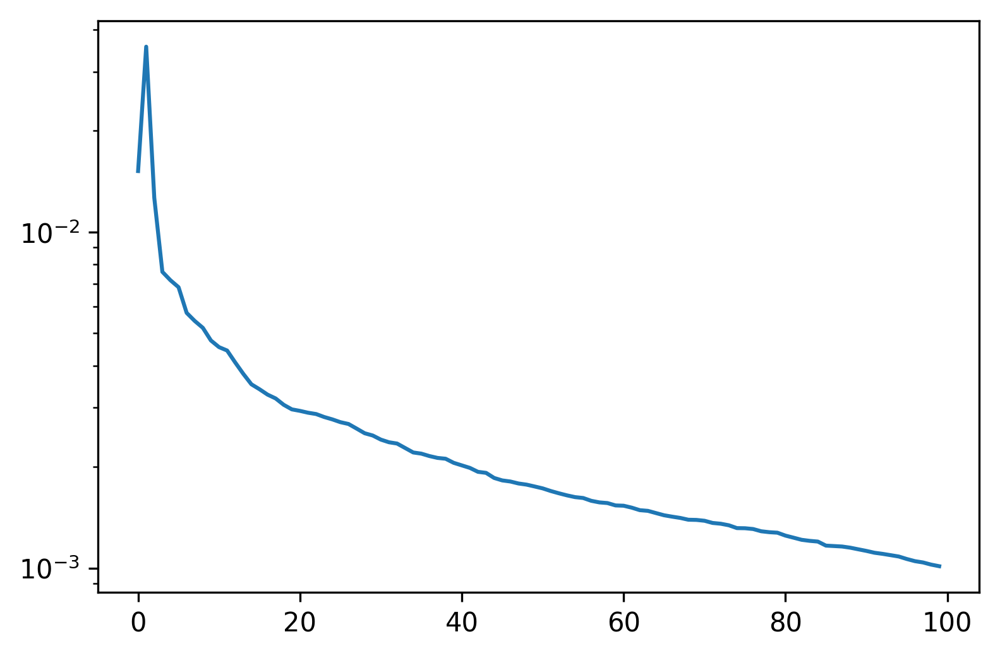

In [22]:
plt.semilogy(lsa_normalized.explained_variance_ratio_)

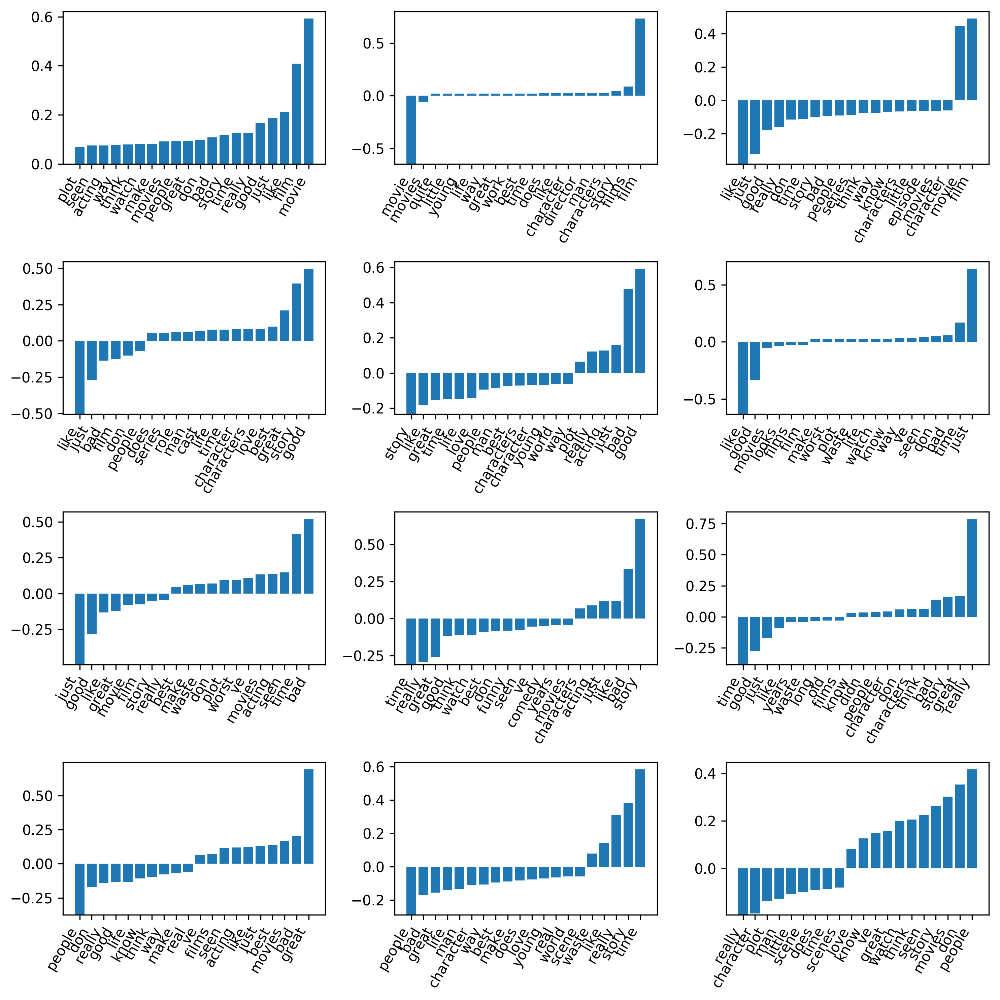

In [63]:
feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), lsa_normalized.components_):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [24]:
from sklearn.preprocessing import MaxAbsScaler
scaler = MaxAbsScaler()
X_scaled = scaler.fit_transform(X_train)

lsa_scaled = TruncatedSVD(n_components=100)
X_lsa_scaled = lsa_scaled.fit_transform(X_scaled)

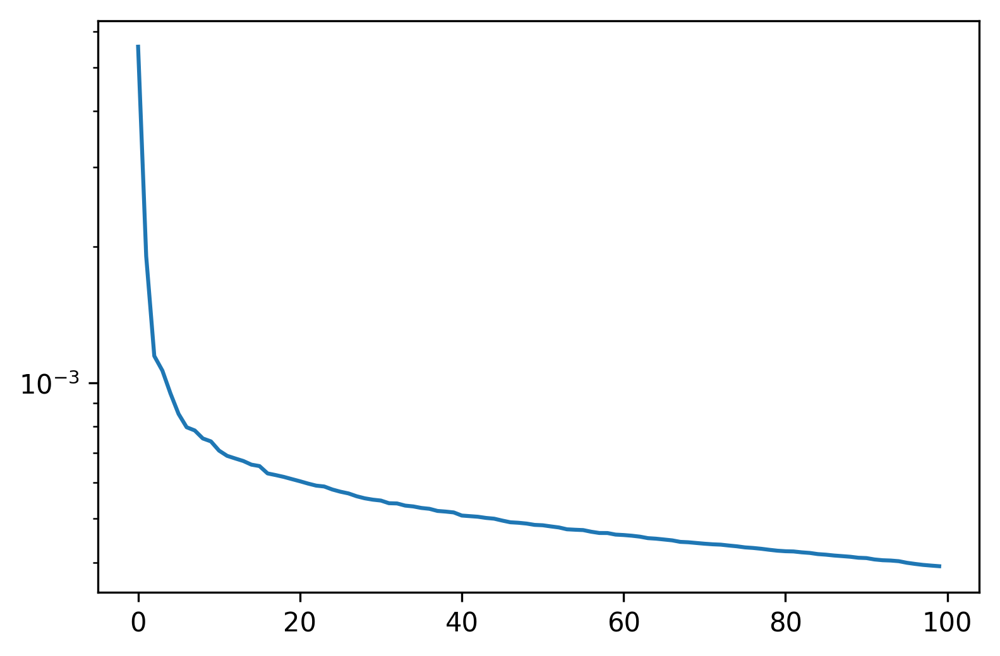

In [25]:
plt.semilogy(lsa_scaled.explained_variance_ratio_)

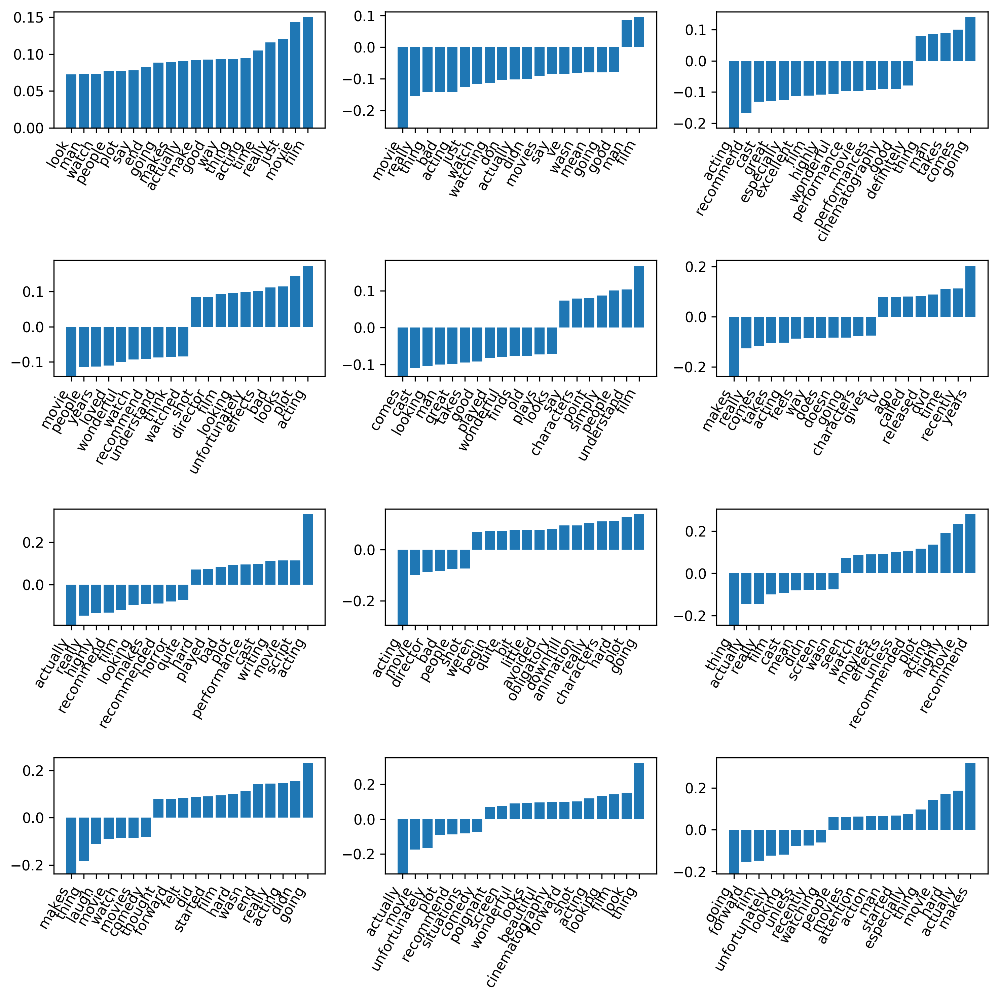

In [62]:
feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), lsa_scaled.components_):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

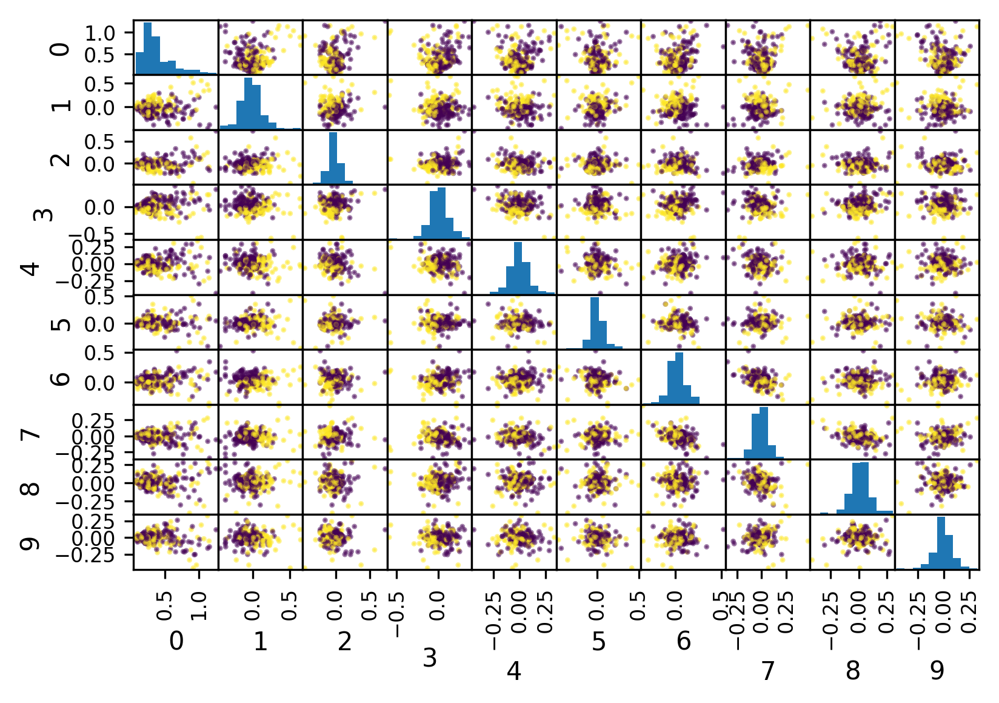

In [27]:
df_scaled = pd.DataFrame(X_lsa_scaled[::100, :10])
pd.tools.plotting.scatter_matrix(df_scaled, c=y_train[::100], s=5);

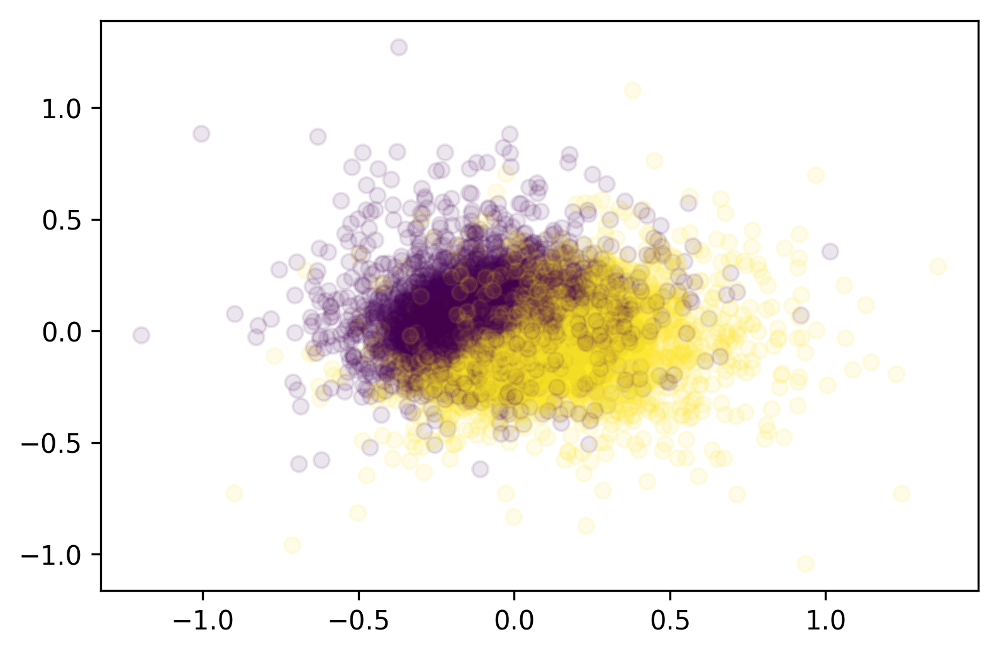

In [29]:
plt.scatter(X_lsa_scaled[:, 1], X_lsa_scaled[:, 3], alpha=.1, c=y_train)

In [34]:
reviews_test = load_files("../data/aclImdb/test/")
text_test, y_test = reviews_test.data, reviews_test.target
text_test = [doc.replace(b"<br />", b" ") for doc in text_test]
X_test = vect.transform(text_test)

In [35]:
X_test_lsa_scaled = lsa_scaled.transform(scaler.transform(X_test))

In [37]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(C=.1).fit(X_train, y_train)
lr.score(X_test, y_test)

0.87263999999999997

In [52]:
lr_lsa = LogisticRegression(C=100).fit(X_lsa_scaled[:, :10], y_train)
lr_lsa.score(X_test_lsa_scaled[:, :10], y_test)

0.82711999999999997

In [54]:
lr_lsa.score(X_lsa_scaled[:, :10], y_train)

0.82808000000000004

In [47]:
lsa_scaled1k = TruncatedSVD(n_components=1000)
X_lsa_scaled1k = lsa_scaled1k.fit_transform(X_scaled)

In [48]:
X_test_lsa_scaled1k = lsa_scaled1k.transform(scaler.transform(X_test))

In [49]:
lr_lsa = LogisticRegression().fit(X_lsa_scaled1k, y_train)
lr_lsa.score(X_test_lsa_scaled1k, y_test)

0.87448000000000004

In [51]:
lr_lsa.score(X_lsa_scaled1k, y_train)

0.89392000000000005

In [95]:
from sklearn.decomposition import NMF
nmf_scale = NMF(n_components=100, verbose=10, tol=0.01)
nmf_scale.fit(X_scaled)

violation: 1.0
violation: 0.38186151316584965
violation: 0.4204226742694693
violation: 0.33823648087318475
violation: 0.2805961252203648
violation: 0.2281999703916126
violation: 0.18611997983415232
violation: 0.15275607055188445
violation: 0.1299676154303241
violation: 0.11828615259646189
violation: 0.10891613087335218
violation: 0.10051917844060011
violation: 0.09163170651812742
violation: 0.08224882157966593
violation: 0.07385773189204294
violation: 0.06582915377604273
violation: 0.05888421004953725
violation: 0.053313385221428845
violation: 0.04840446100038683
violation: 0.043610126455242954
violation: 0.03915370261869885
violation: 0.035368926749352395
violation: 0.03217342327140006
violation: 0.029428069581515094
violation: 0.027141652214009434
violation: 0.025354366127433286
violation: 0.023993497019701368
violation: 0.02286963717331751
violation: 0.022081577205781563
violation: 0.021719589627329134
violation: 0.02174661050376748
violation: 0.022009926319869526
violation: 0.02239

In [99]:
X_nmf_scale = nmf_scale.transform(X_scaled)

violation: 1.0
violation: 0.5940040132432519
violation: 0.06343935126506316
violation: 0.015687984473089903
violation: 0.003989745972721347
Converged at iteration 5


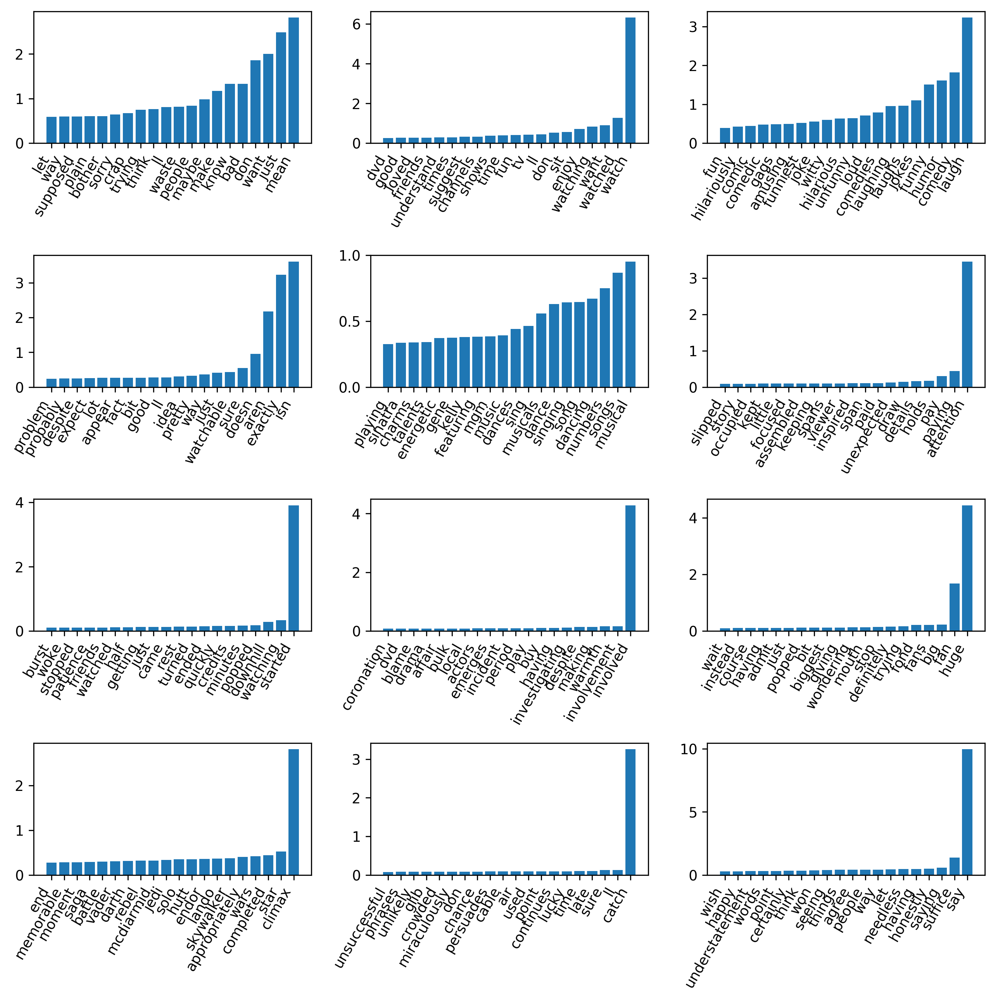

In [100]:
large_comp_inds = np.argsort(X_nmf_scale.mean(axis=0))[-12:][::-1]

feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), nmf_scale.components_[large_comp_inds, :]):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

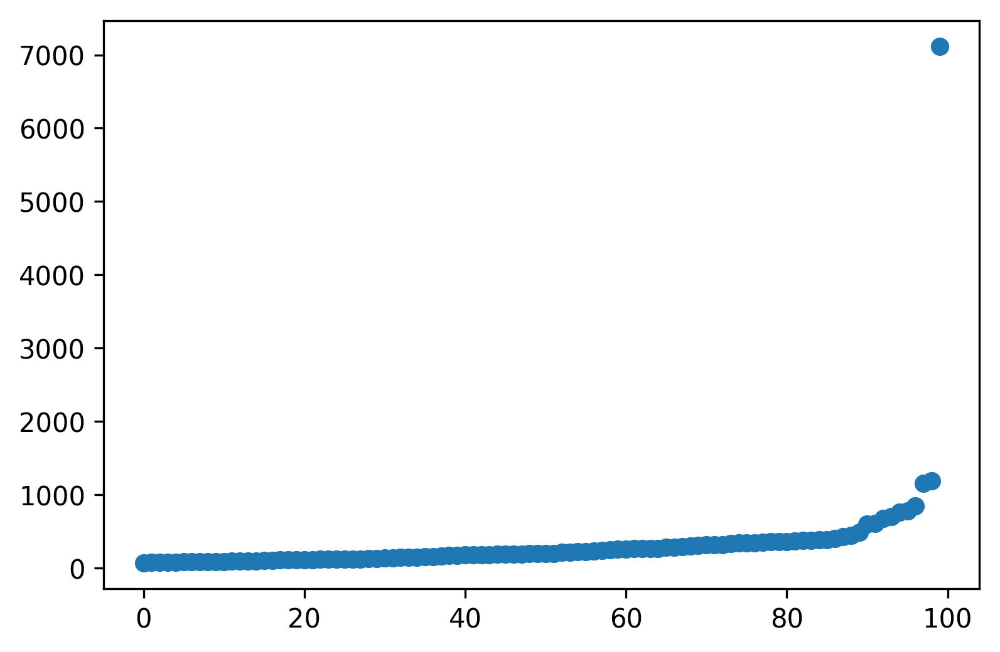

In [90]:
plt.plot(np.sort(nmf.components_.sum(axis=1)), "o")

In [91]:
from sklearn.decomposition import NMF
nmf = NMF(n_components=100, verbose=10, tol=0.01)
X_nm_noscale = nmf.fit_transform(X_train)

violation: 1.0
violation: 0.4068609129036179
violation: 0.3474241473955407
violation: 0.2541227739341606
violation: 0.1747203473133311
violation: 0.13645604739390793
violation: 0.10871680430122106
violation: 0.090897637296534
violation: 0.07496230054910552
violation: 0.05469801497423789
violation: 0.03880137803809359
violation: 0.0302622345032291
violation: 0.02357019987904291
violation: 0.018682948507863527
violation: 0.015550367615663611
violation: 0.013204299418852344
violation: 0.011162933756873572
violation: 0.009620588537951828
Converged at iteration 18


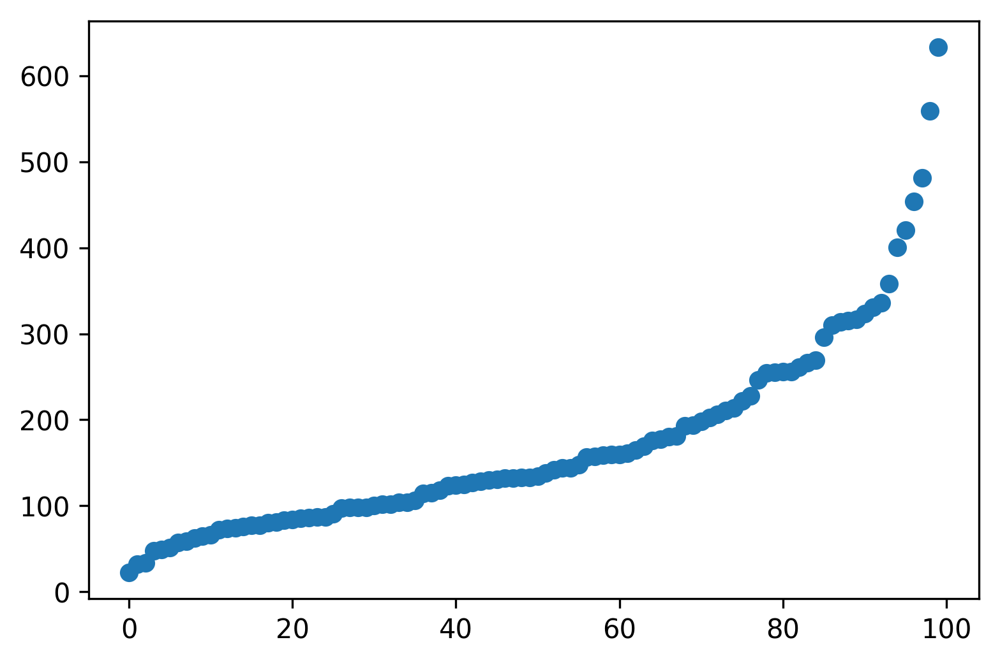

In [92]:
plt.plot(np.sort(nmf.components_.sum(axis=1)), "o")

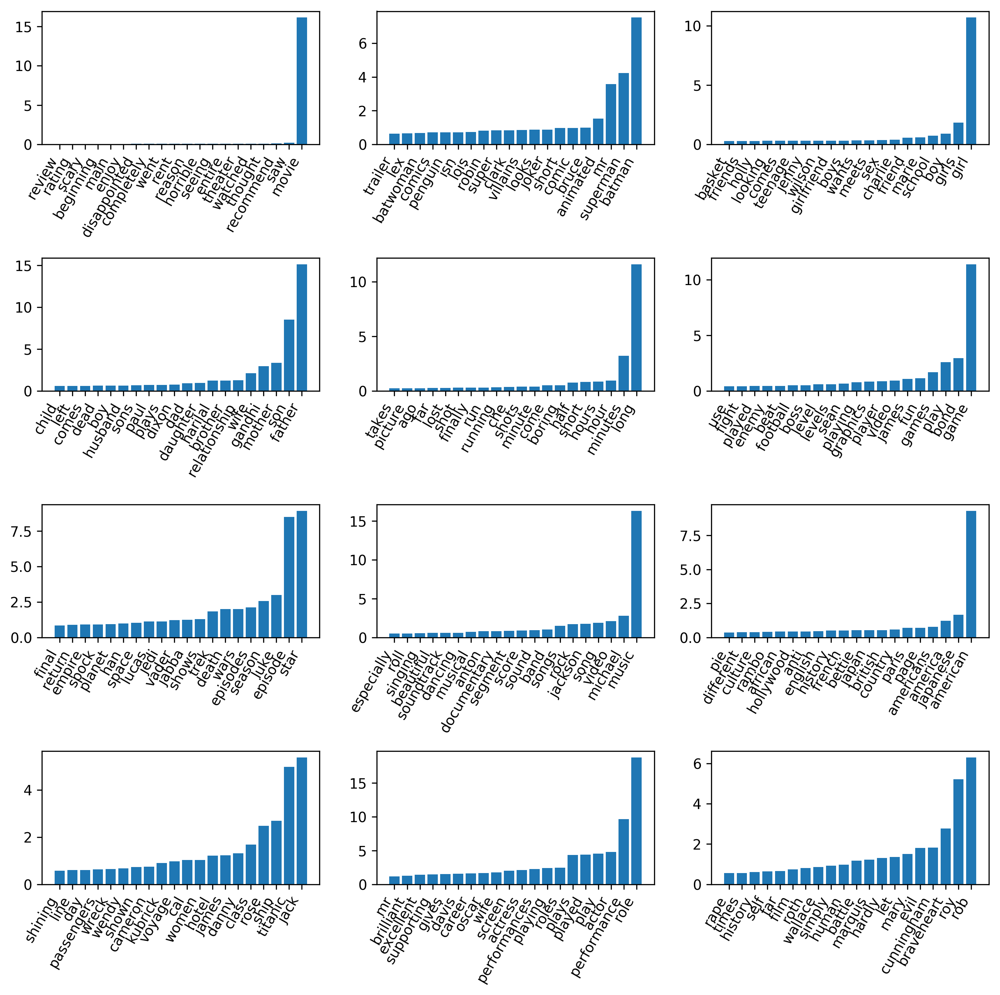

In [94]:
large_comp_inds = np.argsort(X_nmf.mean(axis=0))[-12:][::-1]

feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), nmf.components_[large_comp_inds, :]):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [96]:
def print_topics(topics, feature_names, components, topics_per_chunk=6,
                 n_words=20):
    sorting = np.argsort(components, axis=1)[:, ::-1]
    for i in range(0, len(topics), topics_per_chunk):
        # for each chunk:
        these_topics = topics[i: i + topics_per_chunk]
        # maybe we have less than topics_per_chunk left
        len_this_chunk = len(these_topics)
        # print topic headers
        print(("topic {:<8}" * len_this_chunk).format(*these_topics))
        print(("-------- {0:<5}" * len_this_chunk).format(""))
        # print top n_words frequent words
        for i in range(n_words):
            try:
                print(("{:<14}" * len_this_chunk).format(
                    *feature_names[sorting[these_topics, i]]))
            except:
                pass
        print("\n")


In [97]:
sorting = np.argsort(nmf.components_, axis=1)[:, ::-1]
print_topics(large_comp_inds, feature_names, sorting)

topic 1       topic 93      topic 83      topic 68      topic 91      topic 62      
--------      --------      --------      --------      --------      --------      
movie         batman        girl          father        long          game          
saw           superman      girls         son           minutes       bond          
recommend     mr            boy           mother        hour          play          
thought       animated      school        gandhi        hours         games         
watched       bruce         marie         wife          short         fun           
theater       comic         friend        relationship  half          james         
entire        short         charlie       brother       boring        video         
seeing        joker         sex           harilal       come          player        
horrible      looks         meets         daughter      minute        graphics      
reason        villains      wants         dad           shots    

In [102]:
from sklearn.feature_extraction.text import TfidfTransformer
X_tfidf = TfidfTransformer().fit_transform(X_train)
from sklearn.decomposition import NMF
nmf = NMF(n_components=100, verbose=10, tol=0.01)
X_nmf_tfidf = nmf.fit_transform(X_tfidf)

violation: 1.0
violation: 0.3230977216361302
violation: 0.3923188554977721
violation: 0.3412967606274844
violation: 0.25042567365438434
violation: 0.16909814096676062
violation: 0.11998257690929538
violation: 0.08786615686200691
violation: 0.06671062268211177
violation: 0.05232114170724301
violation: 0.042883714051331075
violation: 0.036330183973524305
violation: 0.03127696455925205
violation: 0.02733315698358363
violation: 0.024235194515930782
violation: 0.0218493794218393
violation: 0.01968653527656753
violation: 0.017542181113426782
violation: 0.01555299927849916
violation: 0.013679468264838953
violation: 0.012012234858054657
violation: 0.010592237141938216
violation: 0.009441009955089754
Converged at iteration 23


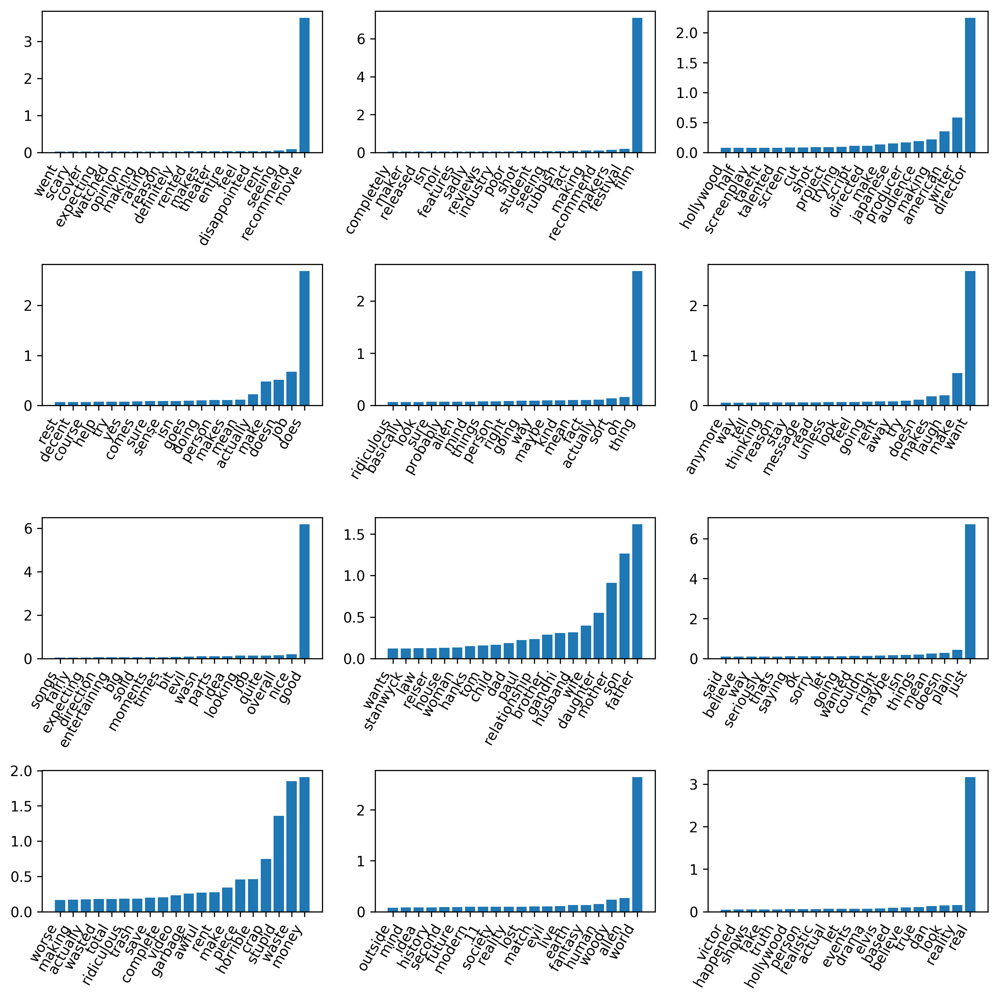

In [107]:
large_comp_inds = np.argsort(X_nmf_tfidf.mean(axis=0))[-12:][::-1]

feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), nmf.components_[large_comp_inds, :]):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [116]:
from sklearn.feature_extraction.text import TfidfTransformer
X_tfidf = TfidfTransformer().fit_transform(X_train)
from sklearn.decomposition import NMF
nmf10 = NMF(n_components=10, verbose=10, tol=0.001)
X_nmf_tfidf10 = nmf10.fit_transform(X_tfidf)

violation: 1.0
violation: 0.507949233985119
violation: 0.35763731078503747
violation: 0.2704743056512017
violation: 0.2132957886880096
violation: 0.17432320343521257
violation: 0.1452012046290175
violation: 0.12129270735255124
violation: 0.10579575093489832
violation: 0.09542318712322348
violation: 0.08790482284913352
violation: 0.08132335989547378
violation: 0.07445155553959701
violation: 0.06788899226465697
violation: 0.060496480071408426
violation: 0.053818492023960954
violation: 0.04976707817109905
violation: 0.04620296863845753
violation: 0.04347763355642459
violation: 0.04144511668468209
violation: 0.03959942201753751
violation: 0.03784246885139631
violation: 0.03612745702392676
violation: 0.03431747712095447
violation: 0.03251139353836266
violation: 0.030810999771948854
violation: 0.02932768385520031
violation: 0.027978789900532236
violation: 0.02679144450210988
violation: 0.026025815179584178
violation: 0.025412569587795662
violation: 0.024907871839744355
violation: 0.024655569

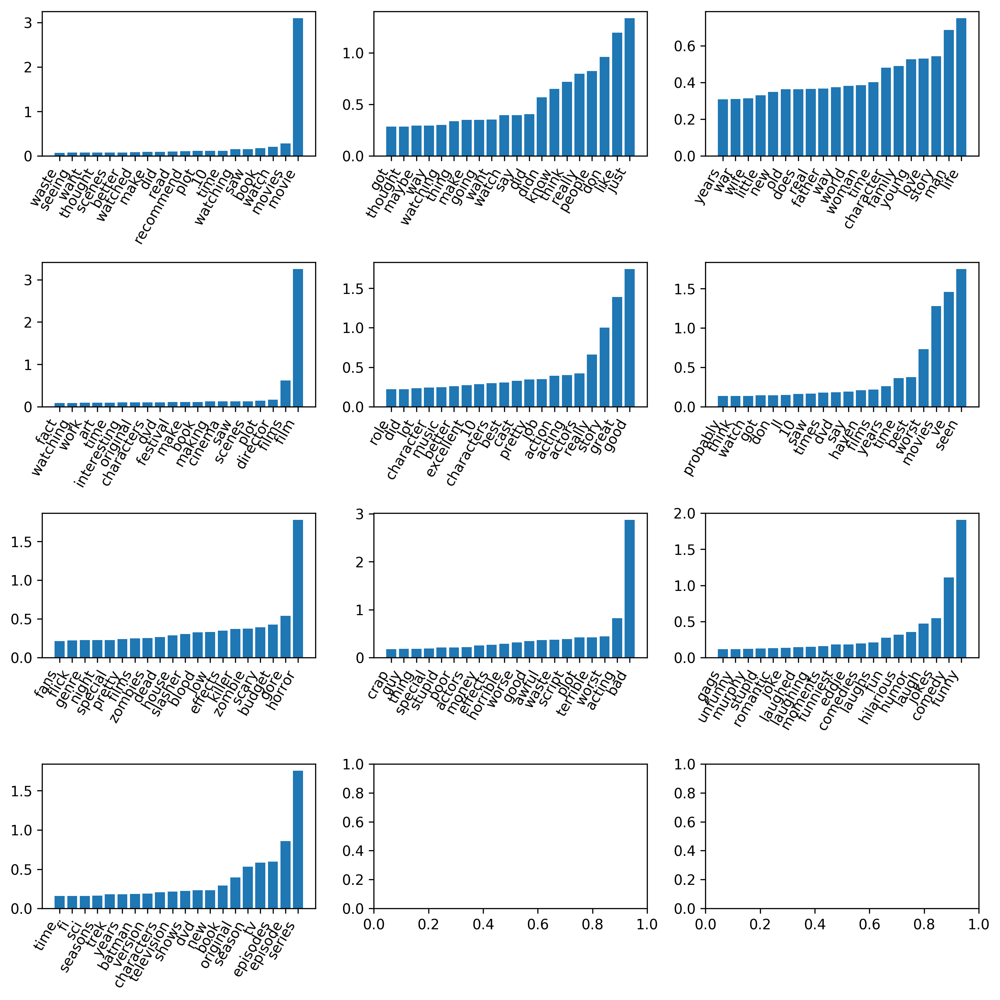

In [117]:
large_comp_inds = np.argsort(X_nmf_tfidf10.mean(axis=0))[-12:][::-1]

feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), nmf10.components_[large_comp_inds, :]):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [122]:
from sklearn.decomposition import LatentDirichletAllocation
lda = LatentDirichletAllocation(n_topics=10, learning_method="batch")
X_lda = lda.fit_transform(X_train)

In [123]:
lda.fit(X_train)

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   24.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   24.3s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   21.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   21.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   27.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   27.6s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.9s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   20.6s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   16.6s remaining:    0.0s
[Parallel(n_jobs=1)]

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7,
             learning_method='batch', learning_offset=10.0,
             max_doc_update_iter=100, max_iter=10, mean_change_tol=0.001,
             n_jobs=1, n_topics=10, perp_tol=0.1, random_state=None,
             topic_word_prior=None, total_samples=1000000.0, verbose=10)

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   12.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   12.8s finished


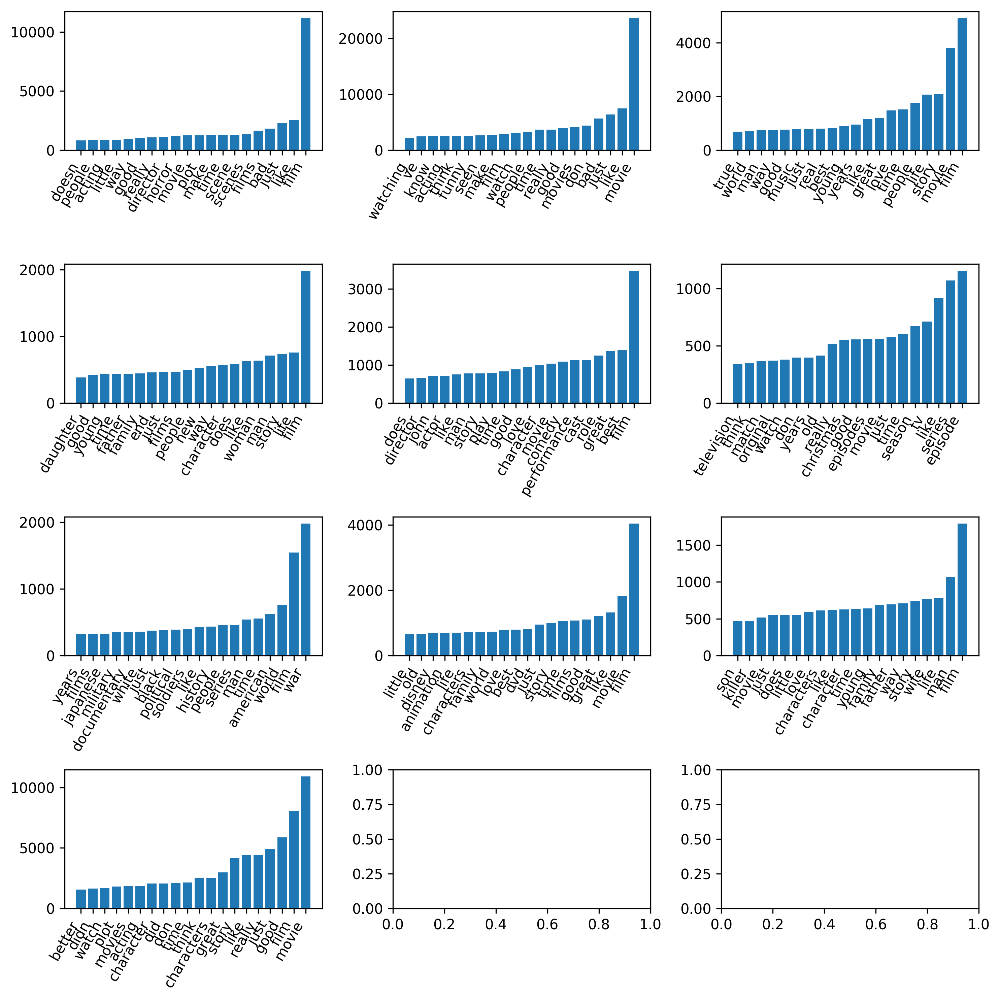

In [125]:
feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), lda.components_):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [128]:
lda100 = LatentDirichletAllocation(n_topics=100, learning_method="batch")
X_lda100 = lda100.fit_transform(X_train)

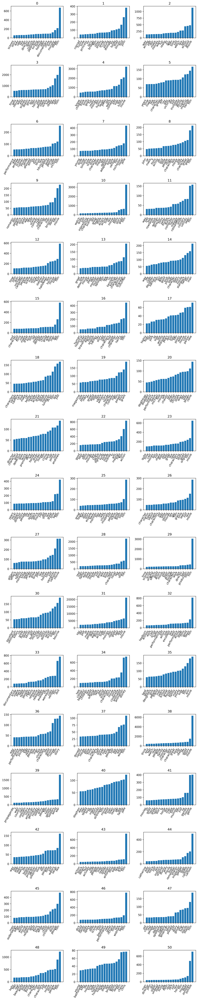

In [136]:
large_comp_inds = np.argsort(X_lda100.mean(axis=0))[-50:][::-1]

feature_names = np.array(vect.get_feature_names())
n_components = 50
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 50))
for i, (ax, coef) in enumerate(zip(axes.ravel(), lda100.components_[:, :])):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    ax.set_title(i)
    
plt.tight_layout()

In [142]:
sorting = np.argsort(lda100.components_, axis=1)[:, ::-1]
print_topics(np.argsort(X_lda100.sum(axis=0))[::-1][:30], feature_names, sorting, topics_per_chunk=8)

topic 31      topic 3       topic 38      topic 4       topic 29      topic 57      topic 60      topic 10      
--------      --------      --------      --------      --------      --------      --------      --------      
movie         film          movie         movie         film          series        film          film          
just          just          story         funny         films         episode       horror        good          
like          like          good          like          production    tv            films         story         
bad           really        life          kids          bad           episodes      like          films         
good          bad           really        just          director      season        story         plot          
really        scene         just          comedy        like          good          seen          movie         
don           make          love          watch         work          like          good        

In [139]:
np.argsort(X_lda100.sum(axis=0))

array([72, 51, 17, 49, 83,  1, 81, 59, 11, 98, 44, 76, 55, 20, 68, 71, 90,
       37, 77, 63, 66, 50, 47, 73, 95, 78, 25, 86, 89, 42, 56, 93, 61, 79,
       80, 64, 67, 85, 74, 18, 91,  6, 92, 13, 30, 21, 19, 43, 36, 40,  9,
       96, 16, 27, 97, 14,  7,  5, 54,  8, 26, 35, 87, 41,  0, 84, 58, 52,
       70, 94, 53, 34, 32, 65, 88, 15, 45, 46, 39, 82, 24, 75, 23, 33, 12,
       22, 62, 99, 69,  2, 48, 28, 10, 60, 57, 29,  4, 38,  3, 31])

In [ ]:
lda_concentrated = LatentDirichletAllocation(n_topics=10, learning_method="batch", topic_word_prior=1e-5)
X_lda_concentrated = lda_concentrated.fit_transform(X_train)

In [ ]:
feature_names = np.array(vect.get_feature_names())
n_components = 10
fig, axes = plt.subplots(n_components // 3 + 1, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), lda_concentrated.components_):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

In [149]:
X_lda_concentrated.sum(axis=0)

array([ 24602.773,     37.173,     37.221,     42.245,     37.58 ,
           42.547,     40.242,     38.623,     40.848,     80.748])